## Import main libraries


In [1]:
# !pip install numpy
# !pip install matplotlib
# !pip install scipy


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io.wavfile import read
from IPython.display import Audio, display


# Basic functions



In [ ]:
def spectrogram(x, T, p): 
    wind = 0.54 - 0.46 * np.cos(2 * np.pi * np.arange(T) / (T - 1)) 
    x = (x - np.mean(x)) / np.std(x) 
    S = np.fft.fft(np.array([x[i:i + T] for i in range(0, len(x) - T, p)]) * wind) 
    return np.abs(S), np.angle(S)

def spectrogram2wav(amp, phase, p): 
    temp = amp * np.exp(1j * phase) 
    temp = np.fft.ifft(temp)  
    temp = np.real(temp) 

    n, w = amp.shape
    duree = (n - 1) * p + w  
    signal = np.zeros(duree) 
    trams = np.zeros(duree)  
    for i in range(n):
        signal[i * p:i * p + w] += temp[i, :]
        trams[i * p:i * p + w] += 1

    signal = signal / trams 
    return signal

def showspectrogram(amp, fs): 
    n, T = amp.shape 
    maxfreq = fs / 2  
    maxindice = int(T / 2)  
    S = np.log10(amp.T[:maxindice] + 1)  
    plt.pcolormesh(np.arange(n), np.linspace(0, maxfreq, maxindice), S, cmap='gray_r') 
    plt.ylabel('Frekuensi(Hz)')
    plt.xlabel('Waktu (sec)')
    plt.grid()
    plt.show()

# Noise cancelling functions


In [ ]:

def Energy(amp): 
    print(f'amp  : {amp.shape}') 
    e = np.mean(amp ** 2, axis=1) 
    print(f'energy  : {e.shape}') 
    return e


def NoiseCancelling(amp, threshold=6, alpha=1):
    energy = Energy(amp) 
    silence = amp[energy < threshold] 
    print(f'silence: {silence.shape}')
    silence = np.mean(silence, axis=0) 
    print(f'silence mean : {silence.shape}')
    amp = amp - silence * alpha 
    amp[amp < 0] = 0 
    return amp

### Select file


In [6]:
fs, sgn = read('ts2.wav')
print(f'sampling rate : {fs}Hz')
display(Audio(sgn, rate=fs))

sampling rate : 16000Hz


## Transisi ke domain frekuensi dan tampilan spektogram

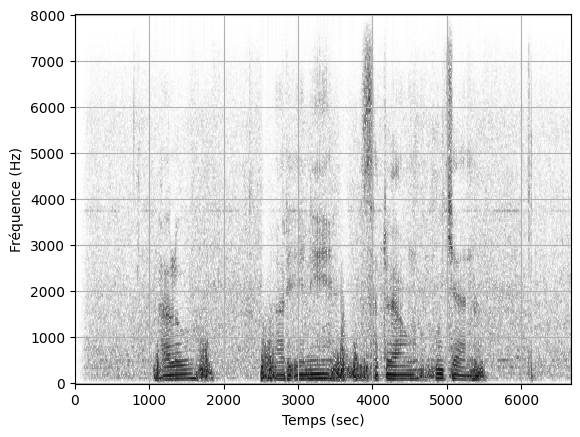

In [7]:
T = 512
p = 16
amp, ph = spectrogram(sgn, T, p)
showspectrogram(amp, fs)

## kembali ke domain waktu menggunakan amplitudo dan fase dan dengarkan hasilnya

In [8]:
new_sgn = spectrogram2wav(amp, ph, p)
display(Audio(new_sgn, rate=fs))


# Pengaplikasian Pengurangan NOise


amp  : (6668, 512)
energy  : (6668,)
silence: (3453, 512)
silence mean : (512,)


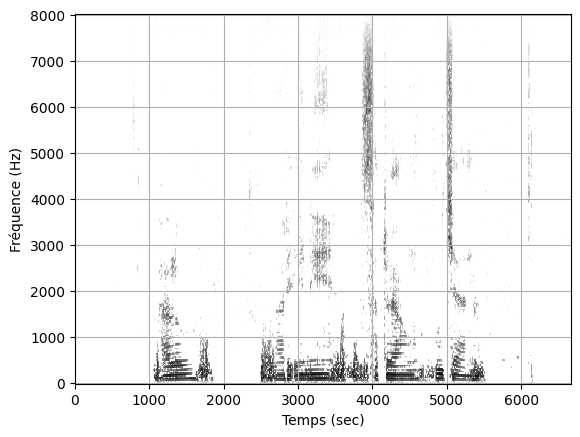

In [9]:
new_sound = NoiseCancelling(amp, threshold=100, alpha=3)
new_amp, new_ph = spectrogram(new_sound, T, p)
showspectrogram(new_sound, fs)
new_sound = spectrogram2wav(new_sound, ph, p)

In [10]:
display(Audio(new_sound, rate=fs))

Menyimpan audio yang telah dikurangi noisenya

In [ ]:
from scipy.io.wavfile import write
import numpy as np

new_sound_int16 = (new_sound * 32767 / np.max(np.abs(new_sound))).astype(np.int16)

output_path = "denoised_audio.wav"
write(output_path, fs, new_sound_int16)

print(f"Audio yang telah dihilangkan noise-nya disimpan sebagai '{output_path}'")


Audio yang telah dihilangkan noise-nya disimpan sebagai 'denoised_audio.wav'


Penambahan Noise

In [22]:
fs, sgn = read('tnoise.wav')
print(f'sampling rate : {fs}Hz')
display(Audio(sgn, rate=fs))

sampling rate : 16000Hz


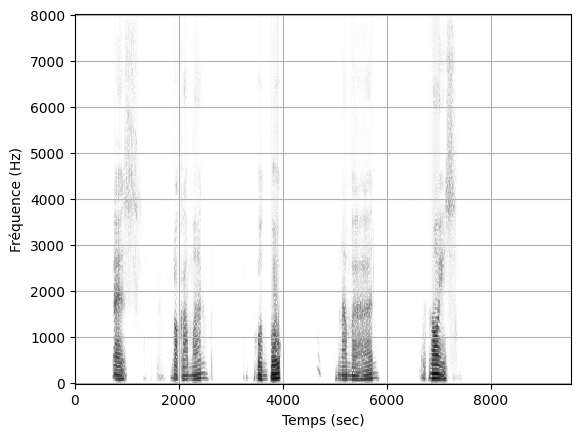

In [23]:
T = 512 #Jumlah sampel per frame
p = 16 #Langkah pergeseran jendela
amp, ph = spectrogram(sgn, T, p)
showspectrogram(amp, fs)

In [24]:
fs, sgn = read('ch13.wav')
print(f'sampling rate : {fs}Hz')
display(Audio(sgn, rate=fs))

sampling rate : 16000Hz


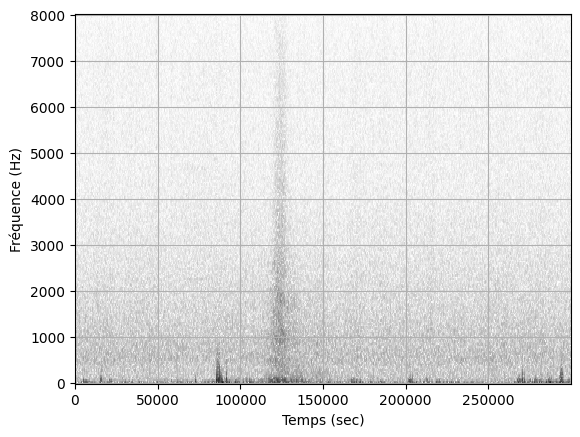

In [25]:
T = 512
p = 16
amp, ph = spectrogram(sgn, T, p)
showspectrogram(amp, fs)

In [ ]:
import array
import numpy as np
import random
import wave

def cal_adjusted_rms(clean_rms, snr):
    a = float(snr) / 20
    noise_rms = clean_rms / (10**a) 
    return noise_rms

def cal_amp(wf):
    buffer = wf.readframes(wf.getnframes()) 
    amptitude = (np.frombuffer(buffer, dtype="int16")).astype(np.float64) 
    return amptitude

def cal_rms(amp): 
    return np.sqrt(np.mean(np.square(amp), axis=-1))

def save_waveform(output_path, params, amp): 
    output_file = wave.Wave_write(output_path)
    output_file.setparams(params) #params: parameter WAV (jumlah kanal, lebar sampel, framerate, dll.)
    output_file.writeframes(array.array('h', amp.astype(np.int16)).tobytes()) #Konversi amplitudo ke format PCM 16-bit (int16).
    output_file.close()

clean_file = "C:\\Users\\HP\\Downloads\\noise33\\noise\\tnoise.wav"
noise_file = "C:\\Users\\HP\\Downloads\\noise33\\noise\\ch13.wav"
output_mixed_file = "C:\\Users\\HP\\Downloads\\noise33\\noise\\output_mixed_file.wav"
snr = 10  # Signal-to-Noise Ratio

clean_wav = wave.open(clean_file, "r")
noise_wav = wave.open(noise_file, "r")

clean_amp = cal_amp(clean_wav)
noise_amp = cal_amp(noise_wav)

clean_rms = cal_rms(clean_amp)

start = random.randint(0, len(noise_amp) - len(clean_amp)) 
divided_noise_amp = noise_amp[start: start + len(clean_amp)]
noise_rms = cal_rms(divided_noise_amp)
adjusted_noise_rms = cal_adjusted_rms(clean_rms, snr)

# Sesuaikan amplitudo noise sesuai SNR
adjusted_noise_amp = divided_noise_amp * (adjusted_noise_rms / noise_rms)
mixed_amp = (clean_amp + adjusted_noise_amp) 

# menghindari clipping noise dengan memastikan nilai amplitudo berada dalam rentang [-32768, 32767]
max_int16 = np.iinfo(np.int16).max
min_int16 = np.iinfo(np.int16).min
if mixed_amp.max(axis=0) > max_int16 or mixed_amp.min(axis=0) < min_int16:
    if mixed_amp.max(axis=0) >= abs(mixed_amp.min(axis=0)):
        reduction_rate = max_int16 / mixed_amp.max(axis=0) #Jika nilai amplitudo melampaui batas, amplitudo seluruh sinyal dikurangi secara proporsional (reduction_rate).
    else:
        reduction_rate = min_int16 / mixed_amp.min(axis=0)
    mixed_amp = mixed_amp * reduction_rate
    clean_amp = clean_amp * reduction_rate

save_waveform(output_mixed_file, clean_wav.getparams(), mixed_amp)
print(f"File mixed audio disimpan di: {output_mixed_file}")


File mixed audio disimpan di: C:\Users\HP\Downloads\noise33\noise\output_mixed_file.wav


In [32]:
fs, sgn = read('output_mixed_file.wav')
print(f'sampling rate : {fs}Hz')
display(Audio(sgn, rate=fs))

sampling rate : 16000Hz


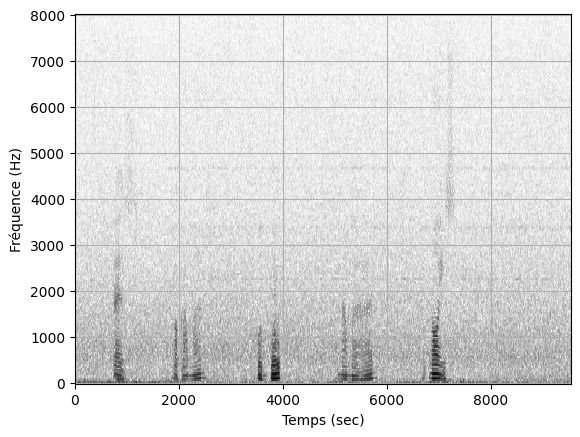

In [33]:
T = 512
p = 16
amp, ph = spectrogram(sgn, T, p)
showspectrogram(amp, fs)

new_sgn = spectrogram2wav(amp, ph, p)
display(Audio(new_sgn, rate=fs))


amp  : (9548, 512)
energy  : (9548,)
silence: (7962, 512)
silence mean : (512,)


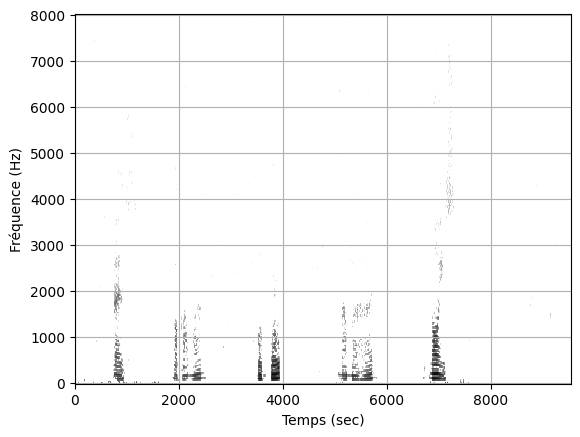

In [34]:
new_sound2 = NoiseCancelling(amp, threshold=100, alpha=3)
new_amp, new_ph = spectrogram(new_sound2, T, p)
showspectrogram(new_sound2, fs)
new_sound2 = spectrogram2wav(new_sound2, ph, p)

In [35]:
display(Audio(new_sound, rate=fs))